In [22]:
import matplotlib.pyplot as plt
import numpy as np
import os, scipy, pickle
import matplotlib

if os.getcwd().split(os.sep)[-1] == "examples":
    os.chdir('..')

# We import the model, stimuli, and the optimal control package
from neurolib.models.wc import WCModel
from neurolib.utils.stimulus import ZeroInput
from neurolib.optimal_control import oc_wc
from neurolib.optimal_control import cost_functions as cost_functions
from neurolib.optimal_control.oc_utils.plot_oc import plot_oc_singlenode
import scipy

import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# This will reload all imports as soon as the code changes
%load_ext autoreload
%autoreload 2

# We define colors for later convenience
color_x = 'red'
color_y = 'blue'
fs_=16
plt.rcParams["figure.figsize"] = (10,6)
plt.rcParams["axes.titlesize"] = fs_
plt.rcParams["axes.labelsize"] = fs_
matplotlib.rc('xtick', labelsize=fs_) 
matplotlib.rc('ytick', labelsize=fs_) 
plt.rc('legend',fontsize=fs_)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [15]:
def plot_single(time, state, control, target, filename=None):

    fig, ax = plt.subplots(2,1)

    ax[0].plot(time, state[0,0,1:], color="red")
    ax[0].plot(time, state[0,1,1:], color="blue")
    ax[0].plot(time, target[0,0,1:], color="red", linestyle=':')
    ax[0].plot(time, target[0,1,1:], color="blue", linestyle=':')
    #ax[0].set_xlim(0,300)

    ax[1].plot(time, control[0,0,1:], color="red")
    ax[1].plot(time, control[0,1,1:], color="blue")
    #ax[1].set_xlim(0,300)

    if type(filename) != type(None):
        plt.savefig(filename)
    plt.show()

savepath =  '..' + os.sep + '..' + os.sep + '..' + os.sep + '..' + os.sep + 'writing' + os.sep + 'paper2_chaos' + os.sep + 'exploration' + os.sep + 'images_ops' + os.sep

def plot(c_array, filename):

    fig, ax = plt.subplots(len(c_array),1, figsize=(10,2.*len(c_array)))

    time = np.arange(0, duration+dt, dt)

    for i in range(len(c_array)):
        ax[i].plot(time, c_array[i][0,0,:], color="red")
        ax[i].plot(time, c_array[i][0,1,:], color="blue")
        ax[i].set_ylim([-0.4,0.4])
        ax[i].set_title(str(np.round(i*2./(len(c_array)-1), 2))+ " * pi")
        if i != len(c_array)-1:
            ax[i].set_xticklabels([])

    plt.savefig(os.path.join(savepath, filename))
    plt.show()

period =  18.900000000000002
peaks =  [ 109  297  485  674  863 1052 1241 1430 1619 1808 1997]
minima =  [  17  198  386  575  764  953 1142 1331 1520 1709 1898]
peaks =  [  57  245  433  622  811 1000 1189 1378 1567 1756 1945]
minima =  [  56  244  433  622  811 1000 1189 1378 1567 1756 1945]


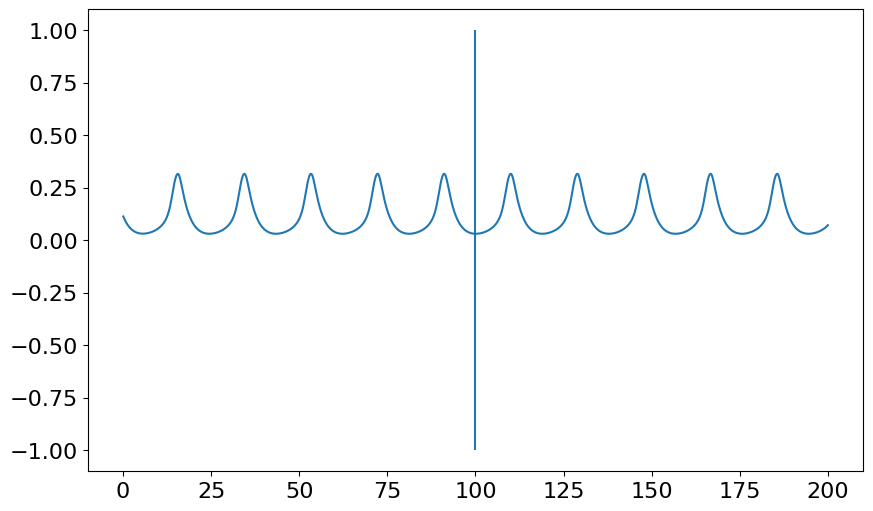

In [3]:
wc = WCModel()
wc.params.sigma_ou = 0.

dt = 0.1
wc.params.dt = dt

duration = 200.
zero_input = ZeroInput().generate_input(duration=duration+dt, dt=dt)
zero_control =np.vstack( [zero_input, zero_input] )[np.newaxis,:,:]
input = zero_control.copy()

wc.params["duration"] = duration
x_init = 0.045135938287846025
y_init = 0.08586538415443892
wc.params["exc_init"] = np.array([[x_init]])
wc.params["inh_init"] = np.array([[y_init]])

wc.params["exc_ext"] = zero_input + 1.
wc.params["inh_ext"] = zero_input

wc.run()

peaks = scipy.signal.find_peaks(wc.exc[0,:])[0]
period = (peaks[-1] - peaks[-2])*dt
print("period = ", period)

wc.run()
peaks = scipy.signal.find_peaks(wc.exc[0,:])[0]
print("peaks = ", peaks)
init_peak = [wc.exc[0,51], wc.inh[0,51]]

mins = scipy.signal.find_peaks(-wc.exc[0,:])[0]
print("minima = ", mins)
init_min = [wc.exc[0,141], wc.inh[0,141]]

wc.params["exc_init"] = np.array([[init_peak[0]]])
wc.params["inh_init"] = np.array([[init_peak[1]]])
wc.run()
target_peak = np.concatenate((np.concatenate( (wc.params["exc_init"], wc.params["inh_init"]), axis=1)[:,:, np.newaxis], np.stack( (wc.exc, wc.inh), axis=1)), axis=2)

peaks = scipy.signal.find_peaks(wc.exc[0,:])[0]
print("peaks = ", peaks)

wc.params["exc_init"] = np.array([[init_min[0]]])
wc.params["inh_init"] = np.array([[init_min[1]]])
wc.run()
target_min = np.concatenate((np.concatenate( (wc.params["exc_init"], wc.params["inh_init"]), axis=1)[:,:, np.newaxis], np.stack( (wc.exc, wc.inh), axis=1)), axis=2)

mins = scipy.signal.find_peaks(-wc.exc[0,:])[0]
print("minima = ", mins)

plt.plot(wc.t, wc.exc[0,:])
plt.vlines(100,-1,1)
plt.show()

In [4]:
control_mat = np.zeros( (wc.params.N, len(wc.state_vars)) )
control_mat[0,0] = 1.
control_mat[0,1] = 1.

prec_mat = np.zeros( (wc.params.N, len(wc.output_vars)) )
prec_mat[0,0] = 1.
prec_mat[0,1] = 1.

int0, int1 = 1000, None
c0, c1 = None, 1000 + np.round(period/dt).astype(int)

duration = 150.
wc.params["duration"] = duration
zero_input = ZeroInput().generate_input(duration=duration+dt, dt=dt)
zero_control =np.vstack( [zero_input, zero_input] )[np.newaxis,:,:]

wc.params["exc_ext"] = zero_input + 1.
wc.params["inh_ext"] = zero_input

In [52]:
filehandler = open("results_min_w2.pickle","rb")
results_min = pickle.load(filehandler)
filehandler.close()

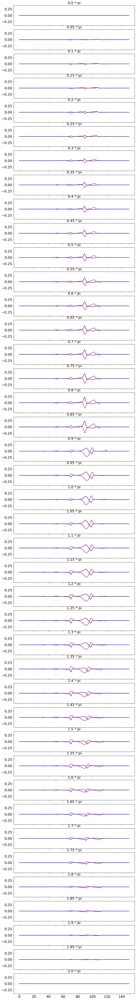

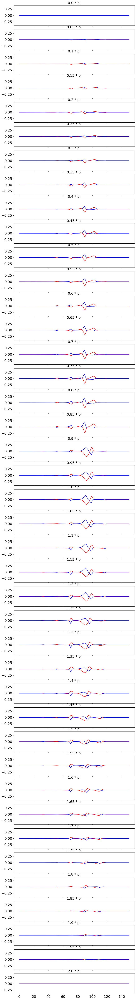

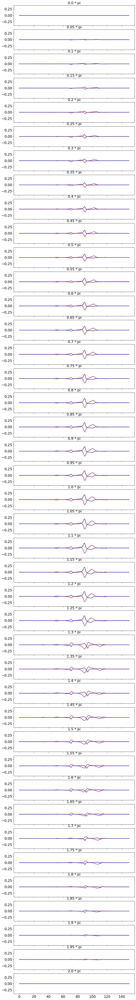

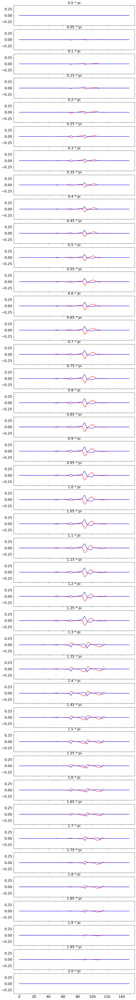

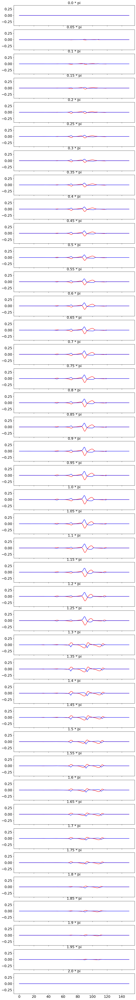

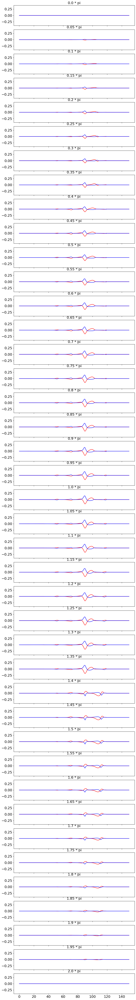

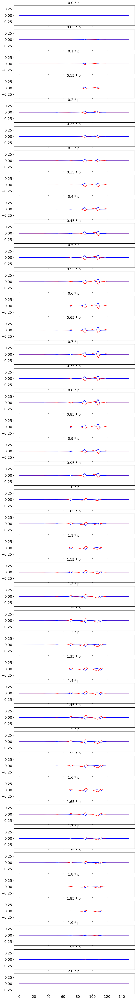

In [53]:
for i_w in range(len(results_min["w2"])):
    plot(results_min["control"][i_w], results_min["filename"][i_w])

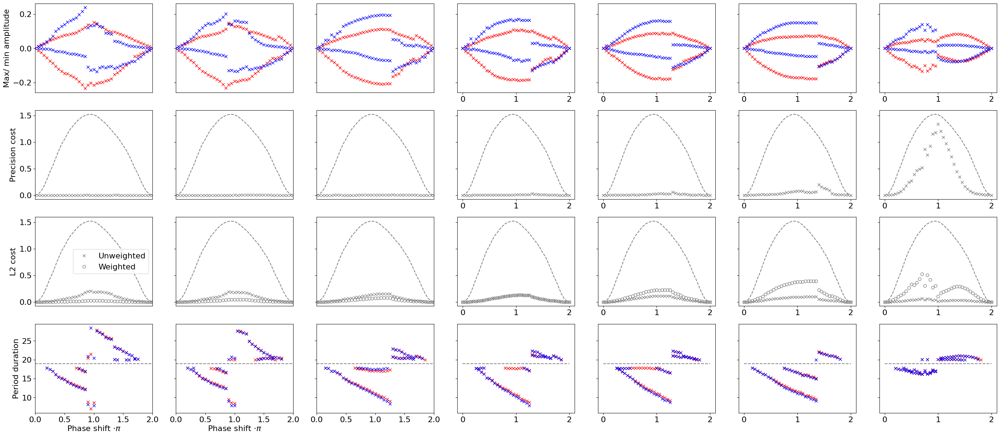

In [54]:
plot1(results_min, "min_plot1.png")
plot2(results_min, "min_plot2.png")

In [55]:
filehandler = open("results_peaks_w2.pickle","rb")
results_peak = pickle.load(filehandler)
filehandler.close()

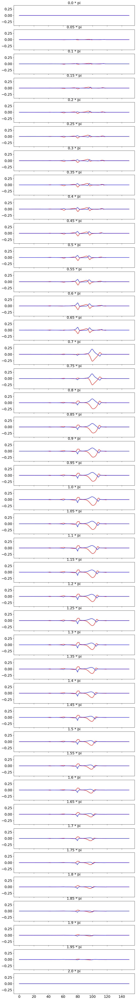

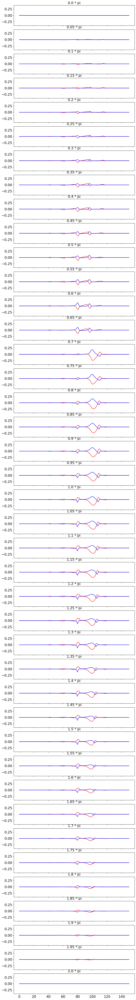

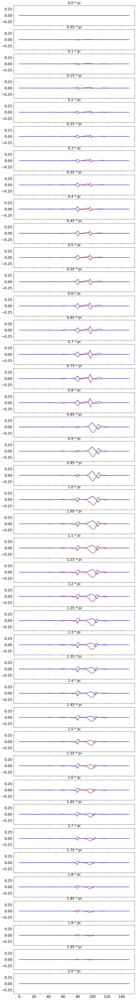

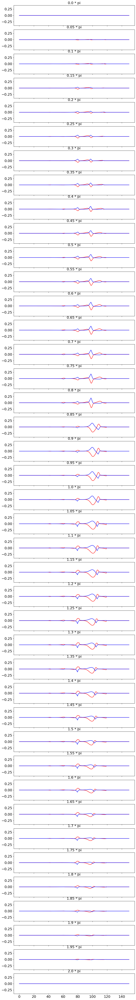

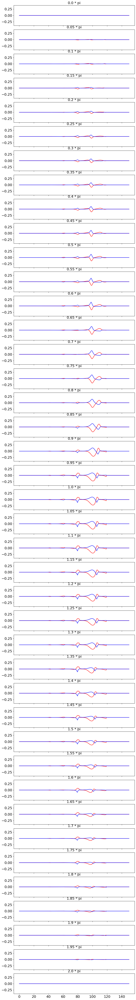

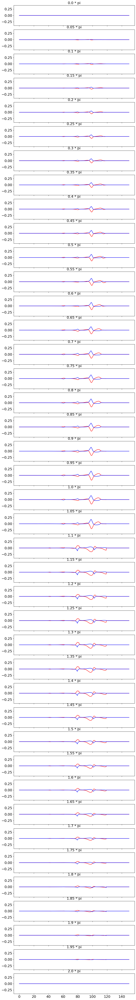

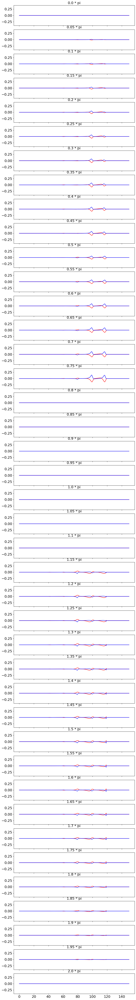

In [56]:
for i_w in range(len(results_peak["w2"])):
    plot(results_peak["control"][i_w], results_peak["filename"][i_w])

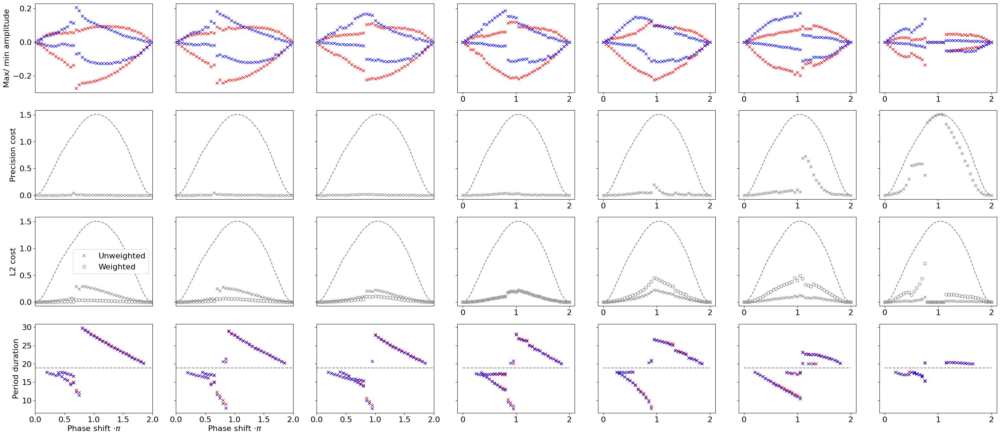

In [57]:
plot1(results_peak, "peak_plot1.png")
plot2(results_peak, "peak_plot2.png")

In [35]:

cmap_red = matplotlib.cm.get_cmap('OrRd')
cmap_blue = matplotlib.cm.get_cmap('PuBu')

def plot1(results_dict, filename):

    n_points = len(results_dict["total_cost"][0])

    init_costs = np.zeros((n_points))
    for i in range(len(init_costs)):
        init_costs[i] = results_dict["total_cost"][0][i][0]

    from matplotlib.lines import Line2D
    import matplotlib

    custom_legend_cost = [
                    Line2D([0], [0], color="grey", linestyle="", marker="x"),
                    Line2D([0], [0], color="grey", linestyle="", marker='o', fillstyle='none'),
                    ]

    r,c = 4, len(results_dict["w2"])
    fig, ax = plt.subplots(r,c, sharey='row', figsize=(5*c,15))

    ax[0,0].set_ylabel("Max/ min amplitude")
    ax[1,0].set_ylabel("Precision cost")
    ax[2,0].set_ylabel("L2 cost")
    ax[3,0].set_ylabel("Period duration")

    ax[-1,0].set_xlabel(r"Phase shift $\cdot \pi$")
    ax[-1,1].set_xlabel(r"Phase shift $\cdot \pi$")

    for i in range(3):
        ax[i,0].set_xticks([])
        ax[i,1].set_xticks([])
        ax[i,2].set_xticks([])

    for i in range(4):
        for j in range(3):
            ax[i,j].set_xlim([0,2])

    for ind_w in range(len(results_dict["w2"])):

        for i_shift in range(n_points):
            period_shift = i_shift* 2. / (n_points-1)

            ax[0,ind_w].plot(period_shift, np.amax(results_dict["control"][ind_w][i_shift][0,0,:]), marker="x", fillstyle='none', color="red")
            ax[0,ind_w].plot(period_shift, np.amin(results_dict["control"][ind_w][i_shift][0,0,:]), marker="x", fillstyle='none', color="red")
            ax[0,ind_w].plot(period_shift, np.amax(results_dict["control"][ind_w][i_shift][0,1,:]), marker="x", fillstyle='none', color="blue")
            ax[0,ind_w].plot(period_shift, np.amin(results_dict["control"][ind_w][i_shift][0,1,:]), marker="x", fillstyle='none', color="blue")

            ax[1,ind_w].plot(period_shift, results_dict["precision_cost"][ind_w][i_shift], marker="x", fillstyle='none', color="grey")

            ax[2,ind_w].plot(period_shift, results_dict["L2_cost_unweighted"][ind_w][i_shift], marker="x", fillstyle='none', color="grey")
            ax[2,ind_w].plot(period_shift, results_dict["L2_cost_weighted"][ind_w][i_shift], marker='o', fillstyle='none', color="grey")
            
            ax[2,0].legend(custom_legend_cost, ["Unweighted", "Weighted"])

            peaks_e = scipy.signal.find_peaks(np.abs(results_dict["state"][ind_w][i_shift][0,0,:]))[0]
            peaks_control_e, properties = scipy.signal.find_peaks(np.abs(results_dict["control"][ind_w][i_shift][0,0,:]), prominence=1e-3)

            periods_e = np.zeros(( len(peaks_e) -1 ))
            for i in range(len(peaks_e)-1):
                periods_e[i] = (peaks_e[i+1] - peaks_e[i])*dt
                if np.abs(periods_e[i] - period )  > 1.:
                    ax[3,ind_w].plot(period_shift, periods_e[i], marker="x", fillstyle='none', color="red")

            peaks_i = scipy.signal.find_peaks(np.abs(results_dict["state"][ind_w][i_shift][0,1,:]))[0]
            peaks_control_i = scipy.signal.find_peaks(np.abs(results_dict["control"][ind_w][i_shift][0,1,:]))[0]

            periods_i = np.zeros(( len(peaks_i) -1 ))
            for i in range(len(peaks_i)-1):
                periods_i[i] = (peaks_i[i+1] - peaks_i[i])*dt
                if np.abs(periods_i[i] - period )  > 1.:
                    ax[3,ind_w].plot(period_shift, periods_i[i], marker="x", fillstyle='none', color="blue")

        ax[1,ind_w].plot(np.linspace(0, 2., n_points, endpoint=True), init_costs, color="grey", linestyle='--')
        ax[2,ind_w].plot(np.linspace(0, 2., n_points, endpoint=True), init_costs, color="grey", linestyle='--')

        ax[3,ind_w].hlines(period, 0, 2., color="grey", linestyle='--')

    plt.savefig(os.path.join(savepath, filename))
    plt.show()

prom = 1. * 1e-4
f_ = 1.1
n_peaks = 1

def addtrace(fig, radii, theta, cstr, height,i, j):
    fig.add_trace(go.Scatterpolar(
                r = radii,
                theta = theta,
                thetaunit = "radians",
                mode = 'lines+markers',
                name = 'Figure 8',
                line_color = cstr,
                line_width = 1,
                marker_size=2.+height*100.,
            ), i, j)


def polardict():
  return dict(
      radialaxis = dict(angle = 0, tickangle = 0),
      angularaxis = dict(thetaunit = "radians", dtick = np.pi * 0.25)
        )


def plot2(results_dict, filename):
    n_points = len(results_dict["total_cost"][0])
    r,c = 2, len(results_dict["w2"])

    t_str = []
    for i in range(c):
        t_str.append(str("w_2 = {}".format(results_dict["w2"][i]) + "<br>" + "E+/I-"))
    for i in range(c):
        t_str.append("E-/I+")

    fig = make_subplots(rows=r, cols=c, specs=[[{'type': 'polar'}]*c]*r,
            subplot_titles=t_str,
            )

    for i_w in range(len(results_dict["w2"])):

        for i_shift in range(n_points):

            peaks = scipy.signal.find_peaks(np.abs(results_dict["state"][i_w][i_shift][0,0,:]))[0]
            periods = np.zeros(( len(peaks) -1 ))
            for i in range(len(peaks)-1):
                periods[i] = (peaks[i+1] - peaks[i])*dt

            for e_i in [0,1]:

                cplus = np.zeros((results_dict["control"][i_w][i_shift][0,e_i,:].shape))
                for t in range(len(cplus)):
                    cplus[t] = max(0., results_dict["control"][i_w][i_shift][0,e_i,t])
                peaks_control_p = scipy.signal.find_peaks( cplus, prominence=prom)[0]
                f=f_
                while len(peaks_control_p) > n_peaks:
                    peaks_control_p = scipy.signal.find_peaks( cplus, prominence=f*prom)[0]
                    f *= f_
                height_plus = np.zeros((len(peaks_control_p)))
                for i in range(len(height_plus)):
                    height_plus[i] = np.abs(results_dict["control"][i_w][i_shift][0,e_i,peaks_control_p[i]])

                cminus = np.zeros((results_dict["control"][i_w][i_shift][0,e_i,:].shape))
                for t in range(len(cminus)):
                    cminus[t] = max(0., -results_dict["control"][i_w][i_shift][0,e_i,t])
                peaks_control_m = scipy.signal.find_peaks( cminus, prominence=prom)[0]
                f=f_
                while len(peaks_control_m) > n_peaks:
                    peaks_control_m = scipy.signal.find_peaks(cminus, prominence=f*prom)[0]
                    f *= f_
                height_minus = np.zeros((len(peaks_control_m)))
                for i in range(len(height_minus)):
                    height_minus[i] = np.abs(results_dict["control"][i_w][i_shift][0,e_i,peaks_control_m[i]])
                
                timing, radii = [], []
                for i in range(len(peaks)-1):
                    for pce in peaks_control_p:
                        if pce < peaks[i+1] and pce >= peaks[i]:
                            timing.append(2. * np.pi * (pce - peaks[i])*dt / periods[i])
                            radii.append(pce*dt)

                if e_i == 0:
                    col = cmap_red(0.3 + i_shift*0.7/(n_points-1))
                elif e_i == 1:
                    col = cmap_blue(0.3 + i_shift*0.7/(n_points-1))
                col_str = 'rgb(' + str(col[0]) + ', ' + str(col[1]) + ', ' + str(col[2]) + ')'
                
                j = i_w+1

                if e_i == 0:
                    i = 1
                else:
                    i = 2
                        
                addtrace(fig, radii, timing, col_str, height_plus, i,j)

                timing, radii = [], []
                for i in range(len(peaks)-1):
                    for pce in peaks_control_m:
                        if pce < peaks[i+1] and pce >= peaks[i]:
                            timing.append(2. * np.pi * (pce - peaks[i])*dt/ periods[i])
                            radii.append(pce*dt)

                if e_i == 1:
                    i = 1
                else:
                    i = 2
                        
                addtrace(fig, radii, timing, col_str, height_minus, i,j)


    fig.update_layout(
        showlegend=False,
        width=400*c,
        height=1000,
        polar = polardict(),
        polar2 = polardict(),
        polar3 = polardict(),
        polar4 = polardict(),
        polar5 = polardict(),
        polar6 = polardict(),
    )

    for i in range(c):
        fig.layout.annotations[i].update(y=1.05)
        fig.layout.annotations[i+c].update(y=0.45)

    fig.write_image(os.path.join(savepath, filename))
    fig.show()